### ECE/CS/ISyE 524 &mdash; Introduction to Optimization &mdash; Spring 2022 ###

# Madison Metro Transit #

#### Agam Goyal (agoyal25@wisc.edu), Ankur Garg (agarg34@wisc.edu), and Erik Thomas Gessner (egessner@wisc.edu)

*****

### Table of Contents

1. [Introduction](#1.-Introduction)
1. [Mathematical Model](#2.-Mathematical-model)
1. [Solution](#3.-Solution)
1. [Results and Discussion](#4.-Results-and-discussion)
1. [Optional Subsection](#4.A.-Feel-free-to-add-subsections)
1. [Conclusion](#5.-Conclusion)

## 1. Introduction ##

Optimization techniques are a brilliant way of modelling various real-life scenarios and play with their behavior in an attempt to improve their working in the real world. In this project, we use a linear program [\[1\]](https://www.analyticsvidhya.com/blog/2017/02/lintroductory-guide-on-linear-programming-explained-in-simple-english/) to model the bus transit system of the city of Madison in Wisconsin with goals of minimizing the average travel time of passengers while also minimizing the fuel consumption costs for the Madison Metro Bus Transit authorities. 

Madison Metro Transit plans to redesign its bus system by August 2023. They're looking to increase access and bus frequency and decrease travel times to better meet the needs of Madison-area residents and businesses, while also being cost effective as per the proposed budget for the project.

Metro Transit transportation planner Mike Cechvala emphasizes on the need for this change as there hasn't been any significant remodeling of the system in the last two decades [\[2\]](https://badgerherald.com/news/2021/04/12/madison-metro-transit-plans-for-bus-system-redesign-to-improve-overall-quality/#:~:text=Madison%20Metro%20Transit%20will%20redesign,the%20experience%20of%20transit%20riders). He outlines some major problems in the Metro system which need to be solved. Some of these include cutting down on overlapping routes and replacing them with ones that serve the city more efficiently. Decreasing travel time will reduce vehicle miles and encourage a shift from cars to buses, which would also be in the interest of the environment.

It has also been seen that the ridership has slowly declined for the last six years, with an even greater impact seen in the last couple of years due to COVID-19. We believe that a more efficient system will increase ridership and will allow Metro Transit to live up to its classification as a high-performing system, similar to bus systems in larger cities like Chicago and New York.

The data for this problem we wish to solve comes from the City of Madison Open Data [\[3\]](https://data-cityofmadison.opendata.arcgis.com/) hub. We use three different datasets and utilize them to help us model this problem efficiently. The first is the ridership details of passengers for weekdays, the second is the ridership details by intersections (which are also for weekdays), and the final one is ridership details by stops.

In the upcoming sections of the report, we go over the mathematical optimization model we developed in detail, the solution our model gives us and also its results, and their analysis. Finally we come to a conclusion regarding our results and reflect on what might be some potential pitfalls and things to work on for the future.

<div>
   <img src="https://madisoncommons.org/wp-content/uploads/2020/09/August-2020-Weekday-Service-Map.jpg" width="700">
</div>

## 2. Mathematical model ##

In order to represent the flow of passengeers in a bus-network, we modeled this problem as a min-cost flow problem. Our goal was to minimize the transporatition costs while preserving the current flow of passengers allowed by the bus network. We defined the nodes to be the current intersctions served by the bus system and generated a full connected graph between all nodes. We then used our estimated movement patter to create a unique type flow for each passenger to enforce the current flow constaint. We then used the squared distance between intersections to estimate cost. Because this is a network flow problem,it is and LP.

$$
\newcommand{\QQ}{\mathbb{Q}}
\newcommand{\RR}{\mathbb{R}}
\newcommand{\NN}{\mathbb{N}}
\newcommand{\ZZ}{\mathbb{Z}}
\newcommand{\PP}{\mathbb{P}}
\newcommand{\E}{\mathrm{E}}
\newcommand{\Var}{\mathrm{Var}}
\newcommand{\Cov}{\mathrm{Cov}}
\newcommand{\N}{\mathcal{N}}
\newcommand{\T}{\mathsf{T}}
\newcommand{\lp}{\left(}
\newcommand{\rp}{\right)}
\newcommand{\lb}{\left[}
\newcommand{\rb}{\right]}
\newcommand{\bm}[1]{\boldsymbol{#1}}
\begin{align*}
\underset{x_i \in \mathbb{R^n}}{\text{minimize}}\qquad& c^\T \sum_i x_i \\
\text{subject to:}
\qquad& \forall i, Ax_i = b_i
\end{align*}
$$

Where:  
$A$ is the Incedence matrix of the fully connected network of intersection  
$x_i$ is the flow the satifies the ith pair of conencted stops  
$b_i$ is required movement between ith pair of conencted stops  
$c_j$ is the vector costs of movement between all pairs of nodes 
$\sum_i x_i$ is the total flow of the network

## 3. Solution ##

Here, you should code up your model in Julia + JuMP and solve it. Your code should be clean, easy to read, well annotated and commented, and it should compile! You are not allowed to use other programming languages or DCP packages such as `convex.jl`. **We will be running your code**. Having multiple code blocks separated by text blocks that explain the various parts of your solution will make it much easier for us to understand your project. You may also solve several versions of your problem with different models/assumptions. **Remember that if you do not write your description of the project and commeent your code well, we cannot understand what you have done. Even if it is technically brilliant, you will loose points if you do not write well and comment your code well.**

It's fine to call external packages such as `Gurobi`, but try to minimize the use of other packages. We want to be able to understand what is happening in your code without looking up additional references. 

In [1]:
using DataStructures: DefaultDict
using CSV
using Clp
using Ipopt
using JuMP
using PyPlot
using DataFrames
using LinearAlgebra

In [2]:
#load in data files
raw = CSV.read("Metro_Transit_Ridership_by_Route_Weekday.csv", DataFrame) #Primary data of ridership by route,stop
raw2 = CSV.read("Metro_Transit_Ridership_by_Stop.csv", DataFrame)         #Bus stop data
raw3 = CSV.read("Metro_Transit_Ridership_by_Intersection.csv", DataFrame) #Intersection info
raw4 = copy(raw3)
delete!(raw3, [1]);

In [3]:
#To imporve runtime, sample a subset of the intersection
raw3 = sort(raw3,[1,2])
delete!(raw3, [1:2:nrow(raw3)...]);
delete!(raw3, [1:2:nrow(raw3)...]);
delete!(raw3, [1:2:nrow(raw3)...]);
delete!(raw3, [1:4:nrow(raw3)...]);

In [4]:
#compute the total boarding by route
totalBoardings = combine(groupby(raw, :Route), :DailyBoardings => sum);
routeData = innerjoin(raw, totalBoardings, on = :Route)
rename!(routeData, :DailyBoardings_sum => :RouteBoardings);

In [5]:
#use the total boarding to estimate the flow of passengers in the current bus network
# we approximate that the number of people gettin off is proportional to the number getting on
m = DefaultDict(0)
for row1 in eachrow(routeData)
    for row2 in eachrow(routeData)
        if row1 != row2
            if row1[:Route] == row2[:Route]
                part = row2[:DailyBoardings]/(row1[:RouteBoardings]-row1[:DailyBoardings])
                m[(row1[:StopID],row2[:StopID])] += row1[:DailyBoardings]*part
            end
        end
    end
end
#convert the movememnt data to a dataframe
mvmt = DataFrame(From = Int64[], To = Int64[],Num = Float64[])
for ((a,b),c) in m
    push!(mvmt,(a,b,c))
end

In [6]:
#add latitude and longitiude information to the table generated above
pos1 = select(raw2,[:Lat,:Lon,:StopID])
rename!(pos1, :Lat => :FromLat,:Lon => :FromLon)
pos2 = select(raw2,[:Lat,:Lon,:StopID])
rename!(pos2, :Lat => :ToLat,:Lon => :ToLon)
mvmtPos = innerjoin(mvmt, pos1, on = :From=>:StopID)
mvmtPos = innerjoin(mvmtPos, pos2, on = :To=>:StopID);

In [7]:
#function that takes a coordinate and finds the colosest intersection to that point 
function findClosest(lat,lon)
    best = (99,-1)
    for row in eachrow(raw3)
        dist = (row[:Lat]-lat)^2+(row[:Lon]-lon)^2
        best = min(best,(dist,row[:IntersectionID]))
    end
    return best      
end;

In [8]:
## find the closest intersections to the route positions found earier
i = []
for row in eachrow(mvmtPos)
    push!(i, findClosest(row[:FromLat],row[:FromLon] )[2] )
end
mvmtPos[!,:FromInt] = i
i = []
for row in eachrow(mvmtPos)
    push!(i, findClosest(row[:ToLat],row[:ToLon] )[2] )
end
mvmtPos[!,:ToInt] = i;

In [9]:
# aggregate the flows by intersection
mvmtInt = sort(combine(groupby(mvmtPos, [:FromInt,:ToInt]), :Num => sum),[1,2])
# round the data to 1 digit and multiply by 10 for integeral flow
mvmtInt[!,:Flow] = convert.(Int64, round.(mvmtInt[!,:Num_sum],digits=1)*10 )
#filer out small flow and flow within same intersection
filteredFlow = filter(:Flow => x -> x >0, mvmtInt)
filteredFlow = filter([:FromInt,:ToInt] => (x,y) -> x !=y, filteredFlow);

In [10]:
#find set of important intersection
interset = union(Set(filteredFlow[!,:FromInt]), Set(filteredFlow[!,:ToInt]))
inters = filter(:IntersectionID => x -> x in interset, raw3)
N = nrow(inters) #number of nodes in graph
M = N^2-N #number of edges in graph
#re-index the intersectino from 1-N for later use are array indicies
reIndex = Dict()
for (i,v) in enumerate(inters[!,:IntersectionID] )
    reIndex[v] = i
end
inters[!,:IntersectionID] = collect(1:N);

In [11]:
# defines the cost of movement between to positions
#currently using squared distace
function cost(x1,y1,x2,y2)
    return  (x1-x2)^2 + (y1-y2)^2 
end;

In [18]:
#Generate the incedence matrix and costs for fully connected graph
A = Array{Int}(undef, N, 0) #incedence matrix
c = Vector{Float64}(undef, 0) #cost vector
for row1 in eachrow(inters)
    for row2 in eachrow(inters)
        if row1[:IntersectionID] != row2[:IntersectionID] #fully connected graph (no self-loops)
            e = zeros(Int8, N)
            e[row1[:IntersectionID]] = 1
            e[row2[:IntersectionID]] = -1
            A = [A e]
            push!(c,cost(row1[:Lat],row1[:Lon],row2[:Lat],row2[:Lon]))
        end
    end
end

LoadError: InterruptException:

In [21]:
B = Array{Int}(undef, M, 0) #incedence matrix
for row in enumerate(eachrow(filteredFlow) # for each flow of passengers generate a unique type of flow that must be met
    b = zeros(Int64, M)
    b[reIndex[row[:FromInt]]] = row[:Flow]
    b[reIndex[row[:ToInt]]] = -row[:Flow]
    B = [B b]
end

LoadError: syntax: missing comma or ) in argument list

In [ ]:
m = Model(with_optimizer(Clp.Optimizer))
set_silent(m)
numFlows = nrow(filteredFlow)
@variable(m, X[1:M,1:numFlows]>=0)
println("here")
for (i, row) in enumerate(eachrow(filteredFlow)) # for each flow of passengers generate a unique type of flow that must be met
    b = zeros(Int64, N)
    b[reIndex[row[:FromInt]]] = row[:Flow]
    b[reIndex[row[:ToInt]]] = -row[:Flow]
    @constraint(m, A*(X[:,i]) .== b)
@expression(m, x,  sum(X',dims=1) ) # total of all the flow above
@objective(m,Min,dot(x,c)); #min-cost flow

In [14]:
optimize!(m)
solution_summary(m)

LoadError: InterruptException:

In [15]:
x_opt = value.(x);

LoadError: UndefVarError: x not defined

In [16]:
X = round.(inters[!,:X],digits = 6)
Y = round.(inters[!,:Y],digits = 6)
scatter(X,Y,s=25);
i = 1
for row1 in eachrow(inters)
    for row2 in eachrow(inters)
        if row1[:IntersectionID] != row2[:IntersectionID]
            if(x_opt[i]>0)
                plot((row1[:Lon], row2[:Lon]),(row1[:Lat], row2[:Lat]),color = "black",alpha = .5)
                #println("$(row1[:IntersectionID]) $(row2[:IntersectionID]) $(x_opt[i])")
            end
            i+=1
        end
    end
end
X = round.(raw4[!,:X],digits = 6)
Y = round.(raw4[!,:Y],digits = 6)
scatter(X,Y,s=2);

┌ Warning: `vendor()` is deprecated, use `BLAS.get_config()` and inspect the output instead
│   caller = npyinitialize() at numpy.jl:67
└ @ PyCall /Users/ankurgarg/.julia/packages/PyCall/L0fLP/src/numpy.jl:67


LoadError: UndefVarError: x_opt not defined

Remember to make sure your code compiles! I will be running your code!

## 4. Results and discussion ##



Here is a solution we descovered using a smaller sample size ploted as an undirected graph.

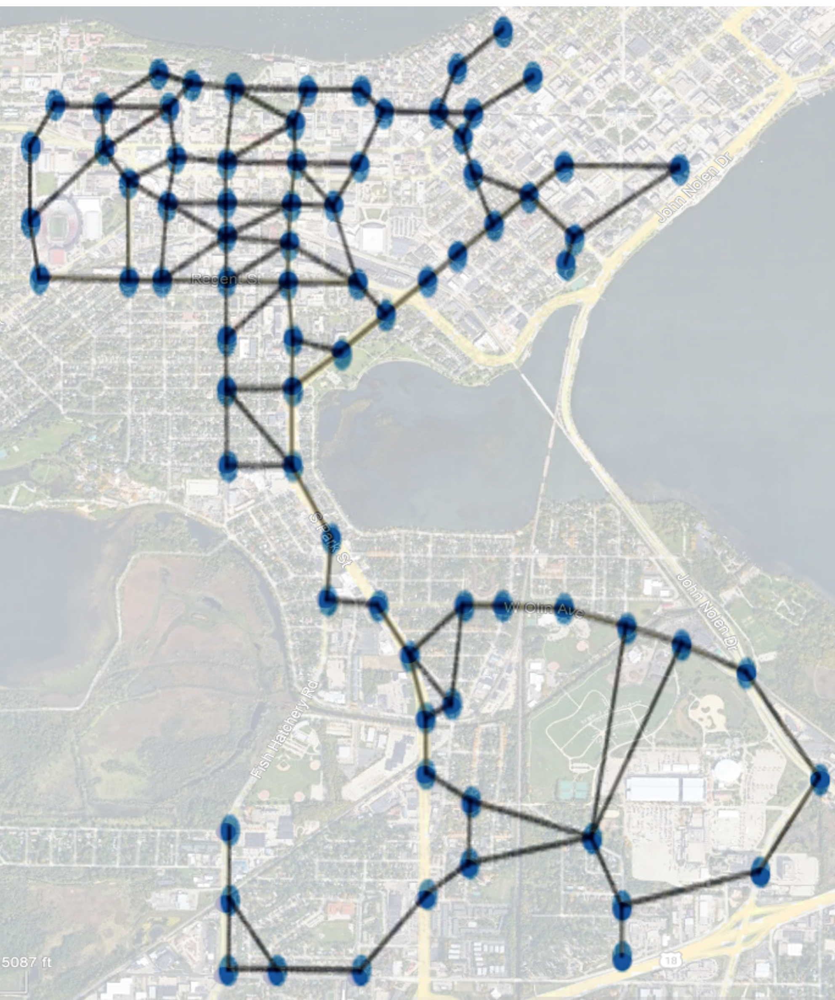

Each edge (line) in the graph represents the movement of a bus from one stop to another. 
<br><br>
This shows the optimal movement of a bus as it prioritizes moving the most amount of passengers (loading and unloading passengers). 
<br><br>
One issue with the data is that it does not include information on how many passengers get off of any given bus at any given stop. To resolve this issue, we estimated the movement in the original bus network. We then used that estimation to help assign values to the edges (connections) of the connected nodes (bus stops) and solved our model as a network flow problem. If we were given the data on passengers departing busses at each stop we could more accurately describe the movement and flow of passengers between stops and thus create a more efficient and effective model.  
<br>



### You can add change the format of sections 2, 3 and 4 to accomodate multiple versions of your model, sensitivity analysis etc. 

## 5. Conclusion ##

Summarize your findings and your results, and talk about at least one possible future direction; something that might be interesting to pursue as a follow-up to your project.

## 6. Author Contributions

Note: The contributions in each category must sum to 100%. See Canvas for more details on what type of work belongs in each category.

#### 1. Modelling  
Agam: Percentage contribution %  
Ankur: Percentage contribution %  
Erik: Percentage contribution %  

  
#### 2. Analysis  
Agam: Percentage contribution %  
Ankur: Percentage contribution %  
Erik: Percentage contribution %  


#### 3. Data Gathering  
Agam: Percentage contribution %  
Ankur: Percentage contribution %  
Erik: Percentage contribution % 


#### 4. Software Implementation  
Agam: Percentage contribution %  
Ankur: Percentage contribution %  
Erik: Percentage contribution %  


#### 5. Report writing and poster presentation   
Agam: Percentage contribution %  
Ankur: Percentage contribution %  
Erik: Percentage contribution % 